### Step-01 : 4 inputs and 1 Neural

Simple Implementation

In [1]:
inputs = [1, 2, 3, 2.5]
weights = [0.2, 0.8, -0.5, 1.0]
bias = 2

output = sum([(inputs[i]*weights[i]) for i in range(len(inputs))])+bias


In [2]:
output


4.8

### Step-02 : 4 inputs and 3 Neural

In [3]:
inputs = [1, 2, 3, 2.5]

weights1 = [0.2, 0.8, -0.5, 1.0]
weights2 = [0.5, -0.91, 0.26, -0.5]
weights3 = [-0.26, -0.27, 0.17, 0.87]

bias1 = 2
bias2 = 3
bias3 = 0.5

output1 = sum([(inputs[i]*weights1[i]) for i in range(len(inputs))])+bias1
output2 = sum([(inputs[i]*weights2[i]) for i in range(len(inputs))])+bias2
output3 = sum([(inputs[i]*weights3[i]) for i in range(len(inputs))])+bias3

output1, output2, output3


(4.8, 1.21, 2.385)

Better :)))

In [4]:
inputs_lst = [1, 2, 3, 2.5]

weights_lst = [
    [0.2, 0.8, -0.5, 1.0],
    [0.5, -0.91, 0.26, -0.5],
    [-0.26, -0.27, 0.17, 0.87]]

biases_lst = [2, 3, 0.5]

output_lst = []
for item in range(len(weights_lst)):
    output_lst.append(sum([(inputs_lst[i]*weights_lst[item][i])
                      for i in range(len(inputs_lst))])+biases_lst[item])


In [5]:
output_lst


[4.8, 1.21, 2.385]

### Step-03 : The Dot Product (Numpy)

In [6]:
# Example

a = ('John', 'Charles', 'Mike')
b = ('Jenny', 'Christy', 'Monica')
x = zip(a, b)
# use the tuple() function to display a readable version of the result:
print(tuple(x))


(('John', 'Jenny'), ('Charles', 'Christy'), ('Mike', 'Monica'))


In [7]:
tuple(zip(weights_lst, biases_lst))


(([0.2, 0.8, -0.5, 1.0], 2),
 ([0.5, -0.91, 0.26, -0.5], 3),
 ([-0.26, -0.27, 0.17, 0.87], 0.5))

In [8]:
for neuron_weights, neuron_bias in zip(weights_lst, biases_lst):
    print(neuron_weights, neuron_bias)


[0.2, 0.8, -0.5, 1.0] 2
[0.5, -0.91, 0.26, -0.5] 3
[-0.26, -0.27, 0.17, 0.87] 0.5


In [9]:
layer_outputs = []  # Output of current layer
for neuron_weights, neuron_bias in zip(weights_lst, biases_lst):
    neuron_output = 0  # Output of given neuron
    for n_input, weight in zip(inputs, neuron_weights):
        neuron_output += n_input*weight
    neuron_output += neuron_bias
    layer_outputs.append(neuron_output)


In [10]:
layer_outputs == output_lst


True

Using Numpy

In [11]:
import numpy as np


In [12]:
output_np = np.dot(weights, inputs)+bias
output_np


4.8

In [13]:
output_lst_np = np.dot(weights_lst, inputs_lst)+biases_lst
output_lst_np


array([4.8  , 1.21 , 2.385])

### Step-04 : Multi Input and 2 layer Neural Network

multi inputs

In [14]:
inputs_lst = [
    [1, 2, 3, 2.5],
    [2.0, 5.0, -1.0, 2.0],
    [-1.5, 2.7, 3.3, -0.8]
]
layer1_output = np.dot(inputs_lst, np.array(weights_lst).T)+biases_lst
print(f'Output of Layer 1 :\n\n {layer1_output}')


Output of Layer 1 :

 [[ 4.8    1.21   2.385]
 [ 8.9   -1.81   0.2  ]
 [ 1.41   1.051  0.026]]


2 layer Neural Network

In [15]:
weights2_lst = [
    [0.1, -0.14, 0.5],
    [-0.5, 0.12, -0.33],
    [-0.44, 0.73, 0.13]]

biases2_lst = [-1, 2, -0.5]
layer2_output = np.dot(layer1_output, np.array(weights2_lst).T)+biases2_lst

print(f'Output of Layer 2 :\n\n {layer2_output}')


Output of Layer 2 :

 [[ 0.5031  -1.04185 -1.41865]
 [ 0.2434  -2.7332  -5.7113 ]
 [-0.99314  1.41254 -0.34979]]


`seed()` in random : the generator creates a random number based on the seed value, so if the seed value is 0 ,
you will always get 0.8444218515250481 as the first random number.

In [16]:
import random
random.seed(0)
random.random()


0.8444218515250481

In [17]:
# np.random.seed(0)

# Features => 3 (x1,x2,x3)
X = [[1, 2, 3, 2.5],
     [2.0, 5.0, -1.0, 2.0],
     [-1.5, 2.7, 3.3, -0.8]]


class Layer_Dense:
    def __init__(self, n_inputs, n_neurons) -> None:
        # 0.1 for normalize data
        # weight(n_neurons,n_inputs) => weight(n_inputs,n_neurons) --> not need more to Transpose
        self.weights = 0.1*np.random.randn(n_inputs, n_neurons)
        self.biases = np.zeros((1, n_neurons))

    def forward(self, inputs) -> None:
        self.output = np.dot(inputs, self.weights)+self.biases


In [18]:
# X => 3*4
layer1 = Layer_Dense(4, 5)
layer2 = Layer_Dense(5, 2)
layer3 = Layer_Dense(2, 1)

layer1.forward(X)
layer1.output


array([[-0.20981044,  0.34383813,  0.02874877,  0.00502446, -0.24206321],
       [-0.83513829,  0.51395121, -0.39338797,  0.29795706,  0.81825911],
       [ 0.20556318, -0.00959025, -0.11801577,  0.11252366, -0.28017074]])

In [19]:
layer2.forward(layer1.output)
layer2.output


array([[-0.0163724 , -0.00430247],
       [-0.27179609, -0.05910363],
       [ 0.04436903, -0.03087312]])

In [20]:
# selected weights of features
layer3.forward(layer2.output)
layer3.output


array([[-0.00077932],
       [-0.01164397],
       [-0.00235289]])

### Step-05 : Activation Function (ReLU)

In [21]:
inputs = [0, 2, -1, 3.3, -2.7, 1.1, 2.2, -100]
output = []

# Activation Func (ReLU)


def activation(inputs):
    output = []
    for i in inputs:
        output.append(max(0, i))
    return output


activation([0, 2, -1, 3.3, -2.7, 1.1, 2.2, -100])


[0, 2, 0, 3.3, 0, 1.1, 2.2, 0]

In [22]:
np.maximum(0, [0, 2, -1, 3.3, -2.7, 1.1, 2.2, -100])


array([0. , 2. , 0. , 3.3, 0. , 1.1, 2.2, 0. ])

using nnfs library 
and load `spiral dataset`

In [23]:
import nnfs
from nnfs.datasets import spiral_data


In [24]:
nnfs.init()


In [25]:
class Layer_Dense:
    def __init__(self, n_inputs, n_neurons) -> None:
        # 0.1 for normalize data
        # weight(n_neurons,n_inputs) => weight(n_inputs,n_neurons) --> not need more to Transpose
        self.weights = 0.1*np.random.randn(n_inputs, n_neurons)
        self.biases = np.zeros((1, n_neurons))

    def forward(self, inputs) -> None:
        self.output = np.dot(inputs, self.weights)+self.biases


class Activation_ReLU:
    def forward(self, inputs):
        self.output = np.maximum(0, inputs)


In [26]:
# 100 points for per class (300)
X, y = spiral_data(100, 3)


In [27]:
# number of features is 2
X.shape, y.shape


((300, 2), (300,))

In [28]:

layer1 = Layer_Dense(2, 5)
activation1 = Activation_ReLU()

layer1.forward(X)
activation1.forward(layer1.output)

layer1.output, activation1.output


(array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00],
        [-8.35815910e-04, -7.90404272e-04, -1.33452227e-03,
          4.65504505e-04,  4.56846210e-05],
        [-2.39994470e-03,  5.93469958e-05, -2.24808278e-03,
          2.03573116e-04,  6.10024377e-04],
        ...,
        [ 1.13291524e-01, -1.89262271e-01, -2.06855070e-02,
          8.11079666e-02, -6.71350807e-02],
        [ 1.34588361e-01, -1.43197834e-01,  3.09493970e-02,
          5.66337556e-02, -6.29687458e-02],
        [ 1.07817926e-01, -2.00809643e-01, -3.37579325e-02,
          8.72561932e-02, -6.81458861e-02]], dtype=float32),
 array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 4.65504505e-04,
         4.56846210e-05],
        [0.00000000e+00, 5.93469958e-05, 0.00000000e+00, 2.03573116e-04,
         6.10024377e-04],
        ...,
        [1.13291524e-01, 0.00000000e

### Step-06 : Softmax Activation

Exponentiation and Normalization (Pure)

In [29]:
import math
layer_outputs = [4.8, 1.21, 2.385]
# E=2.71828182846
E = math.e

# Exponential values
exp_values = []
for output in layer_outputs:
    exp_values.append(E**output)

# Normalization
norm_base = sum(exp_values)
norm_values = []

for value in exp_values:
    norm_values.append(value/norm_base)

# Result
print('Layer outputs : ', layer_outputs)
print('\nExponential values : ', exp_values)
print('\nNormalaze values : ', norm_values)
print('\nSum Of Normalaze values : ', sum(norm_values))


Layer outputs :  [4.8, 1.21, 2.385]

Exponential values :  [121.51041751873483, 3.353484652549023, 10.859062664920513]

Normalaze values :  [0.8952826639572619, 0.024708306782099374, 0.0800090292606387]

Sum Of Normalaze values :  0.9999999999999999


Exponentiation and Normalization (Using Numpy) 

In [30]:

exp_values = np.exp(layer_outputs)
norm_values = exp_values/sum(exp_values)

# Result
print('Exponential values : ', exp_values)
print('\nNormalaze values : ', norm_values)


Exponential values :  [121.51041752   3.35348465  10.85906266]

Normalaze values :  [0.89528266 0.02470831 0.08000903]


In [31]:
layer_outputs = [
    [4.8, 1.21, 2.385],
    [8.9, -1.81, 0.2],
    [1.41, 1.051, 0.026]]
exp_values = np.exp(layer_outputs)

exp_values


array([[1.21510418e+02, 3.35348465e+00, 1.08590627e+01],
       [7.33197354e+03, 1.63654137e-01, 1.22140276e+00],
       [4.09595540e+00, 2.86051020e+00, 1.02634095e+00]])

In [32]:
# axis = 0 --> for select columns
# axis = 1 --> for select rows

np.sum(layer_outputs, axis=1, keepdims=True)

# 4.8+1.21+2.385=8.395


array([[8.395],
       [7.29 ],
       [2.487]])

In [33]:
norm_values = exp_values/np.sum(exp_values, axis=1, keepdims=True)
norm_values


array([[8.95282664e-01, 2.47083068e-02, 8.00090293e-02],
       [9.99811129e-01, 2.23163963e-05, 1.66554348e-04],
       [5.13097164e-01, 3.58333899e-01, 1.28568936e-01]])

Activation Softmax

In [34]:
class Activation_Softmax:
    def forward(self, inputs):

        # Exponential values with Overflow prevention
        exp_values = np.exp(inputs - np.max(inputs, axis=1, keepdims=True))
        # Normalaze values
        probabilities = exp_values / np.sum(exp_values, axis=1, keepdims=True)
        self.output = probabilities


In [35]:
X, y = spiral_data(samples=100, classes=3)

dense1 = Layer_Dense(2, 3)
activation1 = Activation_ReLU()

dense2 = Layer_Dense(3, 3)
activation2 = Activation_Softmax()

dense1.forward(X)
activation1.forward(dense1.output)

dense2.forward(activation1.output)
activation2.forward(dense2.output)

# Result
activation2.output[:5]


array([[0.33333334, 0.33333334, 0.33333334],
       [0.3333351 , 0.3333333 , 0.33333164],
       [0.333271  , 0.3333301 , 0.33339888],
       [0.33329675, 0.33330455, 0.3333987 ],
       [0.333312  , 0.33331376, 0.33337426]], dtype=float32)

### Step-07 : Loss Func

Calculating Loss with Categorical Cross-Entropy

In [36]:
'''
solving for x
e** x = b
'''
b = 5.2
x = np.log(b)
x, np.e**x


(1.6486586255873816, 5.199999999999999)

In [37]:
softmax_output = [0.7, 0.1, 0.2]
target_output = [1, 0, 0]

loss = -(math.log(softmax_output[0])*target_output[0] +
         math.log(softmax_output[1])*target_output[1] +
         math.log(softmax_output[2])*target_output[2])

loss, -math.log(softmax_output[0])


(0.35667494393873245, 0.35667494393873245)

هرچه قدر احتمال مون بالاتر بره مقدار لاس مون کمتر میشه و در نهایت به صفر میل میکنه

In [38]:
-math.log(0.9), -math.log(0.8), -math.log(0.7), -math.log(0.6), -math.log(0.5), -math.log(0.4), -math.log(0.2), -math.log(0.1)


(0.10536051565782628,
 0.2231435513142097,
 0.35667494393873245,
 0.5108256237659907,
 0.6931471805599453,
 0.916290731874155,
 1.6094379124341003,
 2.3025850929940455)

### Step-08 : Implementing Loss

Pure Python

In [39]:
softmax_outputs = [[0.7, 0.1, 0.2], [0.1, 0.5, 0.4], [0.02, 0.9, 0.08]]

# 0 = > Dog
# 1 = > Cat
# 2 = > Human
class_targets = [0, 1, 1]

for target_index, distributution in zip(class_targets, softmax_outputs):
    print(distributution[target_index])


0.7
0.5
0.9


Using Numpy

In [40]:
softmax_outputs = np.array([[0.7, 0.1, 0.2], [0.1, 0.5, 0.4], [0.02, 0.9, 0.08]])

# 0 = > Dog
# 1 = > Cat
# 2 = > Human
class_targets = [0, 1, 1]


np.array([[*list of selected rows*],[*index of per rows you want to choose*]])

In [41]:
softmax_outputs[[0, 1, 2], class_targets]


array([0.7, 0.5, 0.9])

In [42]:
softmax_outputs[range(len(softmax_outputs)), class_targets]


array([0.7, 0.5, 0.9])

calculate loss

In [43]:
# Categotical Cross Entropy
neg_log = -np.log(softmax_outputs[range(len(softmax_outputs)), class_targets])
neg_log


array([0.35667494, 0.69314718, 0.10536052])

In [44]:
average_loss = np.mean(neg_log)
average_loss


0.38506088005216804

In [45]:
np.log(0) , np.log(1)

<ipython-input-45-06061b1a4685>:1: RuntimeWarning: divide by zero encountered in log
  np.log(0) , np.log(1)


(-inf, 0.0)

In [46]:
# min , max
np.log(1e-7) , np.log(1-1e-7)
# 1-1e-7 = 0.9999999

(-16.11809565095832, -1.0000000494736474e-07)

In [47]:
min(np.log(1e-7) , np.log(1-1e-7))

-16.11809565095832

Loss & Categorical Cross Entropy

In [48]:

class Loss:
    def calculate(self, output, y):
        sample_losses, accuracy = self.forward(output, y)
        data_loss = np.mean(sample_losses)
        self.data={
            'loss' : data_loss, 'acc' : accuracy
        }
        return self.data


class Loss_CategoricalCrossEntropy(Loss):
    def forward(self, y_pred, y_true):
        samples = len(y_pred)
        y_pred_clipped = np.clip(y_pred, 1e-7, 1 - 1e-7)

        if len(y_true.shape) == 1:
            # vector
            correct_confidences = y_pred_clipped[range(samples), y_true]
            pred = np.argmax(y_pred_clipped, axis=1)
            accuracy = np.mean(pred == y_true)

        elif len(y_true.shape) == 2:
            # one hot encoded vector
            correct_confidences = np.sum(y_pred_clipped * y_true, axis=1)
            pred = np.argmax(y_pred_clipped, axis=1)
            accuracy = np.mean(pred == np.argmax(y_true, axis=1))

        neg_log_likelihoods = -np.log(correct_confidences)
        return neg_log_likelihoods, accuracy


In [49]:
# Old Steps
X_spiral, y_spiral = spiral_data(samples=100, classes=3)

dense1 = Layer_Dense(2, 3)
activation1 = Activation_ReLU()

dense2 = Layer_Dense(3, 3)
activation2 = Activation_Softmax()

dense1.forward(X_spiral)
activation1.forward(dense1.output)

dense2.forward(activation1.output)
activation2.forward(dense2.output)

# New Step
loss_function=Loss_CategoricalCrossEntropy()
loss_function.calculate(output=activation2.output,y=y_spiral)

{'loss': 1.0989271, 'acc': 0.2733333333333333}

### Step-09 : Final


vertical dataset

In [131]:
from nnfs.datasets import vertical_data
import matplotlib.pyplot as plt

import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 10000
%matplotlib inline

In [72]:
nnfs.init()

X_vertical , y_vertical=vertical_data(samples=100,classes=3)

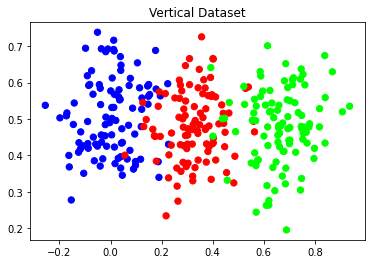

In [73]:
plt.title('Vertical Dataset')
plt.scatter(X_vertical[:,0],X_vertical[:,1],c=y_vertical,s=40,cmap='brg')
plt.show();

numpy.matlib.randn() is another function for doing matrix operations in numpy. It returns a matrix of random values from a univariate “normal” (Gaussian) distribution of mean 0 and variance 1.

In [ ]:
# dense1 = Layer_Dense(2, 3)
# activation1 = Activation_ReLU()

# dense2 = Layer_Dense(3, 3)
# activation2 = Activation_Softmax()

# loss_function = Loss_CategoricalCrossEntropy()


# lowest_loss = 9999999
# best_dense1_weights = dense1.weights.copy()
# best_dense1_biases = dense1.biases.copy()
# best_dense2_weights = dense2.weights.copy()
# best_dense2_biases = dense2.biases.copy()
# loss_lst = []
# acc_lst = []

# for iteration in range(100000):
#     dense1.weights += 0.1 * np.random.randn(2, 3)
#     dense1.biases += 0.1 * np.random.randn(1, 3)
#     dense2.weights += 0.1 * np.random.randn(3, 3)
#     dense2.biases += 0.1 * np.random.randn(1, 3)

#     dense1.forward(X_vertical)
#     activation1.forward(dense1.output)

#     dense2.forward(activation1.output)
#     activation2.forward(dense2.output)
#     result = loss_function.calculate(output=activation2.output, y=y_vertical)
#     loss_lst.append(result["loss"])
#     acc_lst.append(result["acc"])

#     if result["loss"] < lowest_loss:
#         print(
#             f'New set of weights found, iteration : {iteration} loss : {result["loss"]} , acc : {result["acc"]} '
#         )
#         best_dense1_weights = dense1.weights.copy()
#         best_dense1_biases = dense1.biases.copy()
#         best_dense2_weights = dense2.weights.copy()
#         best_dense2_biases = dense2.biases.copy()
#         lowest_loss = result["loss"]
#     else:
#         dense1.weights = best_dense1_weights.copy()
#         dense1.biases = best_dense1_biases.copy()
#         dense2.weights = best_dense2_weights.copy()
#         dense2.biases = best_dense2_biases.copy()


In [79]:
def neural_network_p(X, y, lr=0.05):
    # TODO:amir
    # np.random.seed(0)
    dense1 = Layer_Dense(2, 3)
    activation1 = Activation_ReLU()

    dense2 = Layer_Dense(3, 3)
    activation2 = Activation_Softmax()

    loss_function = Loss_CategoricalCrossEntropy()

    lowest_loss = 9999999
    best_dense1_weights = dense1.weights.copy()
    best_dense1_biases = dense1.biases.copy()
    best_dense2_weights = dense2.weights.copy()
    best_dense2_biases = dense2.biases.copy()
    loss_lst = []
    acc_lst = []

    for iteration in range(100000):
        dense1.weights += lr * np.random.randn(2, 3)
        dense1.biases += lr * np.random.randn(1, 3)
        dense2.weights += lr * np.random.randn(3, 3)
        dense2.biases += lr * np.random.randn(1, 3)

        dense1.forward(X)
        activation1.forward(dense1.output)

        dense2.forward(activation1.output)
        activation2.forward(dense2.output)
        result = loss_function.calculate(output=activation2.output, y=y)
        loss_lst.append(result["loss"])
        acc_lst.append(result["acc"])

        if result["loss"] < lowest_loss:
            # print(
            #     f'New set of weights found, iteration : {iteration} loss : {result["loss"]} , acc : {result["acc"]} '
            # )
            best_dense1_weights = dense1.weights.copy()
            best_dense1_biases = dense1.biases.copy()
            best_dense2_weights = dense2.weights.copy()
            best_dense2_biases = dense2.biases.copy()
            lowest_loss = result["loss"]
        else:
            dense1.weights = best_dense1_weights.copy()
            dense1.biases = best_dense1_biases.copy()
            dense2.weights = best_dense2_weights.copy()
            dense2.biases = best_dense2_biases.copy()
    return loss_lst, acc_lst


In [81]:
loss_lst_vertical_1, acc_lst_vertical_1 = neural_network_p(X_vertical, y_vertical, 0.1)
loss_lst_vertical_05, acc_lst_vertical_05 = neural_network_p(
    X_vertical, y_vertical, 0.05
)


In [133]:
def draw_plot(x, y_loss, y_acc, title):
    plt.rc("font", size=40)
    fig, axs = plt.subplots(2, figsize=(100, 20), frameon=False, dpi=200)
    fig.suptitle(f"{title} subplots")

    # accuracy plot
    axs[0].plot(x, y_acc)
    axs[0]
    axs[0].set_title(f"Accuracy")

    # loss plot
    axs[1].plot(x, y_loss)
    axs[1].set_title(f"Loss")

    fig.tight_layout()
    plt.show()


learning rate : 0.05 = >>> New set of weights found, iteration : 89388 loss : 0.17154254019260406 , acc : 0.9333333333333333 

learning rate : 0.1 = >>> New set of weights found, iteration : 99416 loss : 0.16188456118106842 , acc : 0.9366666666666666 

In [111]:
draw_plot(range(100000),loss_lst_vertical_1,acc_lst_vertical_1,'Vertical Dataset with learning rate 0.1')

In [113]:
draw_plot(
    range(100000),
    loss_lst_vertical_05,
    acc_lst_vertical_05,
    "Vertical Dataset with learning rate 0.05",
)


spiral dataset

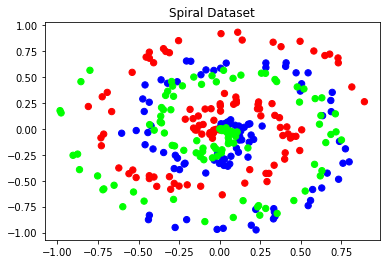

In [55]:
plt.title('Spiral Dataset')
plt.scatter(X_spiral[:,0],X_spiral[:,1],c=y_spiral,s=40,cmap='brg')
plt.show();

In [116]:
loss_lst_spiral_1, acc_lst_spiral_1 = neural_network_p(X_spiral, y_spiral, 0.1)
loss_lst_spiral_05, acc_lst_spiral_05 = neural_network_p(X_spiral, y_spiral, 0.05)


In [136]:
loss_lst_spiral_005, acc_lst_spiral_005 = neural_network_p(X_spiral, y_spiral, 0.005)


In [146]:
loss_lst_spiral_0005, acc_lst_spiral_0005 = neural_network_p(X_spiral, y_spiral, 0.0005)


In [134]:
draw_plot(
    range(100000),
    loss_lst_spiral_1,
    acc_lst_spiral_1,
    "Spiral Dataset with learning rate 0.1",
)


In [135]:
draw_plot(range(100000),loss_lst_spiral_05,acc_lst_spiral_05,'Spiral Dataset with learning rate 0.05')


In [137]:
draw_plot(range(100000),loss_lst_spiral_005,acc_lst_spiral_005,'Spiral Dataset with learning rate 0.005')


In [147]:
draw_plot(range(100000),loss_lst_spiral_0005,acc_lst_spiral_0005,'Spiral Dataset with learning rate 0.0005')


In [142]:
acc_lst_spiral_1.index(max(acc_lst_spiral_1)), max(acc_lst_spiral_1)


(95515, 0.4766666666666667)

In [144]:
acc_lst_spiral_05.index(max(acc_lst_spiral_05)), max(acc_lst_spiral_05)


(11916, 0.48333333333333334)

In [145]:
acc_lst_spiral_005.index(max(acc_lst_spiral_005)), max(acc_lst_spiral_005)


(42882, 0.52)

In [148]:
acc_lst_spiral_0005.index(max(acc_lst_spiral_0005)), max(acc_lst_spiral_0005)


(58487, 0.49666666666666665)